<a href="https://colab.research.google.com/github/napoles-uach/Data/blob/main/GCN_grapheneEnergy_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install dgl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 29.8 MB/s eta 0:00:00


In [ ]:
#Cargar el archivo hojas-1-10000.tar.bz2

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
!cp /gdrive/MyDrive/hojas-1-60000.tar.bz2 .

In [ ]:
!tar -xf hojas-1-60000.tar.bz2

In [ ]:
import os
import numpy as np
import dgl
import torch as th
from scipy.spatial.distance import cdist
import time
from dgl.data import DGLDataset
import torch.nn as nn
import torch.nn.functional as F
start_time = time.time()

xyz_dir = 'hojas-1-60000/'
graphs = []
labels = []

coords_all=[]
nuclear_to_atom_type_map = {6: 0, 7: 1, 5: -1}
element_to_nuclear_charge_map = {"C": 6, "N": 7, "B": 5}
file_count = 0
for file_name in [f for f in os.listdir(xyz_dir) if f.endswith('.xyz')]:
    file_count+=1
    if file_count >= 50:
        break
    file = os.path.join(xyz_dir, file_name)
    
    with open(file) as f:
        n_atoms = int(f.readline().strip())
        energy, nD, nC, nB, nN = map(float, f.readline().split()[:5])
        
        lines = [line.strip().split() for line in f]
        nuclear = np.array([element_to_nuclear_charge_map[line[0]] for line in lines])
        atom_type_values = np.vectorize(nuclear_to_atom_type_map.get)(nuclear)
        coords = np.array([list(map(float, line[1:])) for line in lines])
        x_coords = coords[:, 0]  # Extract the x-coordinates from the first column
        y_coords = coords[:, 1]  # Extract the y-coordinates from the second column
        coord_vec = np.concatenate((x_coords, y_coords), axis=0)
        coords_all.append(coord_vec)

In [ ]:
len(coords_all[0])

1008

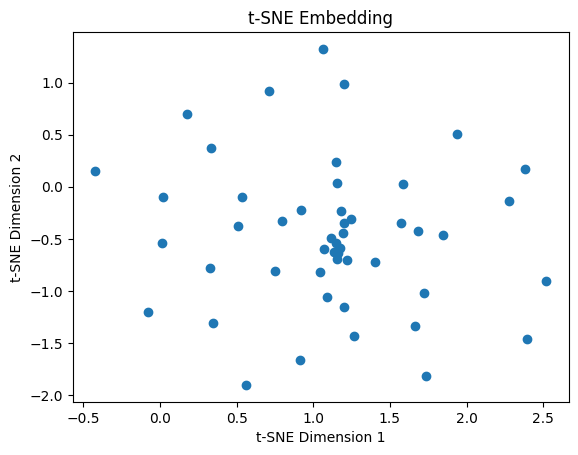

In [ ]:
import os
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

xyz_dir = 'hojas-1-60000/'

coords_all = []
energies = []
nuclear_to_atom_type_map = {6: 0, 7: 1, 5: -1}
element_to_nuclear_charge_map = {"C": 6, "N": 7, "B": 5}
file_count = 0
for file_name in [f for f in os.listdir(xyz_dir) if f.endswith('.xyz')]:
    file_count += 1
    if file_count >= 50:
        break
    file = os.path.join(xyz_dir, file_name)

    with open(file) as f:
        n_atoms = int(f.readline().strip())
        energy, nD, nC, nB, nN = map(float, f.readline().split()[:5])
        energies.append(energy)

        lines = [line.strip().split() for line in f]
        nuclear = np.array([element_to_nuclear_charge_map[line[0]] for line in lines])
        atom_type_values = np.vectorize(nuclear_to_atom_type_map.get)(nuclear)
        coords = np.array([list(map(float, line[1:])) for line in lines])
        x_coords = coords[:, 0]  # Extract the x-coordinates from the first column
        y_coords = coords[:, 1]  # Extract the y-coordinates from the second column
        coord_vec = np.concatenate((x_coords, y_coords), axis=0)
        coords_all.append(coord_vec)

# Convert the coords_all list to a NumPy array
coords_all_np = np.array(coords_all)

# Perform t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embedding = tsne.fit_transform(coords_all_np)

# Plot the t-SNE embedding
plt.scatter(embedding[:, 0], embedding[:, 1])
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE Embedding')
plt.show()


In [ ]:
import os
import numpy as np
import plotly.express as px
import pandas as pd

xyz_dir = 'hojas-1-60000/'

coords_all = []
energies = []
nuclear_to_atom_type_map = {6: 0, 7: 1, 5: -1}
element_to_nuclear_charge_map = {"C": 6, "N": 7, "B": 5}
file_count = 0
for file_name in [f for f in os.listdir(xyz_dir) if f.endswith('.xyz')]:
    file_count += 1
    if file_count >= 500:
        break
    file = os.path.join(xyz_dir, file_name)

    with open(file) as f:
        n_atoms = int(f.readline().strip())
        energy, nD, nC, nB, nN = map(float, f.readline().split()[:5])
        energies.append(nD)

        lines = [line.strip().split() for line in f]
        nuclear = np.array([element_to_nuclear_charge_map[line[0]] for line in lines])
        atom_type_values = np.vectorize(nuclear_to_atom_type_map.get)(nuclear)
        coords = np.array([list(map(float, line[1:])) for line in lines])
        x_coords = coords[:, 0]  # Extract the x-coordinates from the first column
        y_coords = coords[:, 1]  # Extract the y-coordinates from the second column
        coord_vec = np.concatenate((x_coords, y_coords), axis=0)
        coords_all.append(coord_vec)

# Convert the coords_all and energies lists to NumPy arrays
coords_all_np = np.array(coords_all)
energies_np = np.array(energies)

# Perform t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embedding = tsne.fit_transform(coords_all_np)

# Create a dataframe with coordinates and energies
data = {
    'X': embedding[:, 0],
    'Y': embedding[:, 1],
    'Energy': energies_np
}
df = pd.DataFrame(data)

# Plot the t-SNE embedding using Plotly Express
fig = px.scatter(df, x='X', y='Y', hover_data=['Energy'],color='Energy')
fig.update_layout(
    title='t-SNE Embedding',
    xaxis_title='t-SNE Dimension 1',
    yaxis_title='t-SNE Dimension 2'
)
fig.show()


In [ ]:
# 1
import os
import numpy as np
import plotly.express as px
from sklearn.manifold import TSNE
import pandas as pd

xyz_dir = 'hojas-1-60000/'

coords_all = []
energies = []
nD_values = []
nuclear_to_atom_type_map = {6: 0, 7: 1, 5: -1}
element_to_nuclear_charge_map = {"C": 6, "N": 7, "B": 5}
file_count = 0
for file_name in [f for f in os.listdir(xyz_dir) if f.endswith('.xyz')]:
    file_count += 1
    if file_count >= 600:
        break
    file = os.path.join(xyz_dir, file_name)

    with open(file) as f:
        n_atoms = int(f.readline().strip())
        energy, nD, nC, nB, nN = map(float, f.readline().split()[:5])
        energies.append(energy)
        nD_values.append(nD)

        lines = [line.strip().split() for line in f]
        nuclear = np.array([element_to_nuclear_charge_map[line[0]] for line in lines])
        atom_type_values = np.vectorize(nuclear_to_atom_type_map.get)(nuclear)
        coords = np.array([list(map(float, line[1:])) for line in lines])
        x_coords = coords[:, 0]  # Extract the x-coordinates from the first column
        y_coords = coords[:, 1]  # Extract the y-coordinates from the second column
        coord_vec = np.concatenate((x_coords, y_coords), axis=0)
        coords_all.append(coord_vec)

# Convert the coords_all, energies, and nD_values lists to NumPy arrays
coords_all_np = np.array(coords_all)
energies_np = np.array(energies)
nD_values_np = np.array(nD_values)

# Perform t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42,perplexity=30)
embedding = tsne.fit_transform(coords_all_np)

# Create a dataframe with coordinates, energies, and nD values
data = {
    'X': embedding[:, 0],
    'Y': embedding[:, 1],
    'Energy': energies_np,
    'nD': nD_values_np
}
df = pd.DataFrame(data)

# Plot the t-SNE embedding with colored dots and labeled points using Plotly Express
fig = px.scatter(df, x='X', y='Y', color='Energy', hover_data=['Energy', 'nD'],
                 color_continuous_scale='jet'
                 )
fig.update_traces(textposition='top center')
fig.update_layout(
    title='t-SNE Embedding',
    xaxis_title='t-SNE Dimension 1',
    yaxis_title='t-SNE Dimension 2'
)
fig.show()


In [ ]:
from tensorflow import keras
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.mnist.load_data()

11490434/11490434 [==============================] - 0s 0us/step


In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(embedding[:, 0], embedding[:, 1], c=energies_np, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(embedding):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_test[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(energies_np[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
#save_fig("fashion_mnist_visualization_plot")
plt.show()

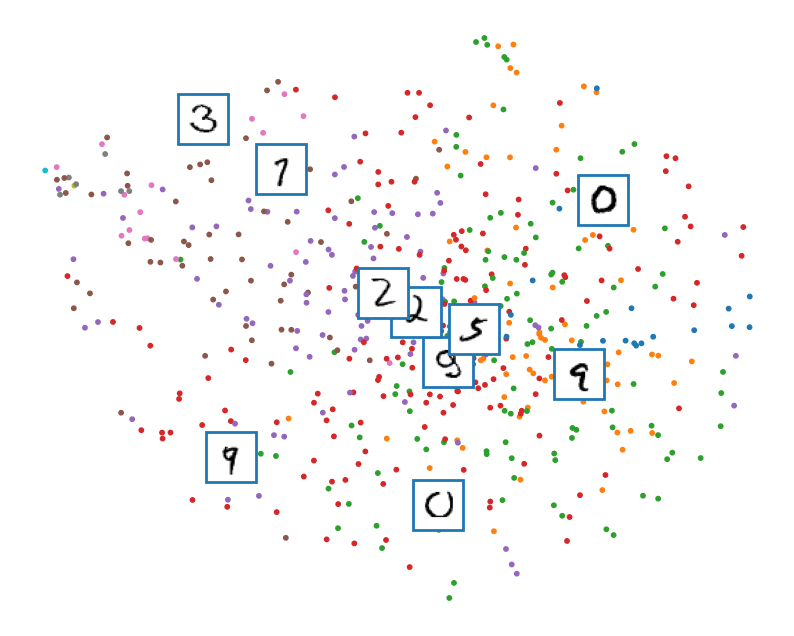

In [ ]:
import numpy as np

# Set the maximum number of annotations
max_annotations = 10

# Randomly select `max_annotations` indices
random_indices = np.random.choice(len(embedding), size=max_annotations, replace=False)

plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(embedding[:, 0], embedding[:, 1], c=energies_np, s=10, cmap=cmap)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(embedding):
    # Check if the current index is in the randomly selected indices
    if index in random_indices:
        dist = np.sum((position - image_positions) ** 2, axis=1)
        if np.min(dist) > 0.02:  # if far enough from other images
            image_positions = np.r_[image_positions, [position]]
            imagebox = mpl.offsetbox.AnnotationBbox(
                mpl.offsetbox.OffsetImage(X_test[index], cmap="binary"),
                position, bboxprops={"edgecolor": cmap(energies_np[index]), "lw": 2})
            plt.gca().add_artist(imagebox)

plt.axis("off")
plt.show()


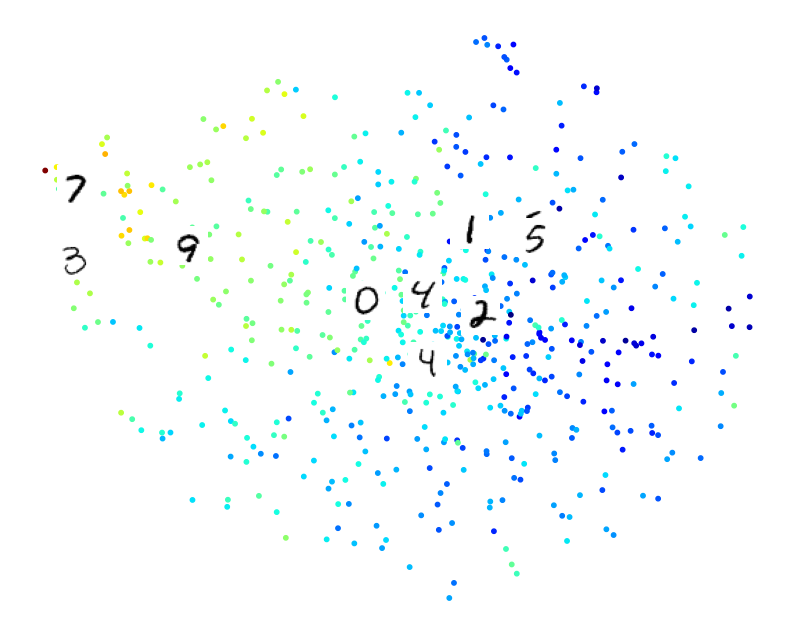

In [ ]:
import numpy as np

# Set the maximum number of annotations
max_annotations = 10

# Randomly select `max_annotations` indices with their corresponding energies
random_indices = np.random.choice(len(embedding), size=max_annotations, replace=False)
random_energies = energies_np[random_indices]

plt.figure(figsize=(10, 8))
#cmap = plt.cm.tab10
cmap = plt.cm.jet
plt.scatter(embedding[:, 0], embedding[:, 1], c=energies_np, s=10, cmap=cmap)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(embedding):
    # Check if the current index and energy are in the randomly selected indices and energies
    if (index in random_indices) and (energies_np[index] in random_energies):
        dist = np.sum((position - image_positions) ** 2, axis=1)
        if np.min(dist) > 0.02:  # if far enough from other images
            image_positions = np.r_[image_positions, [position]]
            imagebox = mpl.offsetbox.AnnotationBbox(
                mpl.offsetbox.OffsetImage(X_test[index], cmap="binary"),
                position, bboxprops={"edgecolor": cmap(energies_np[index]), "lw": 2,'alpha':0.0})
            plt.gca().add_artist(imagebox)

plt.axis("off")
plt.show()


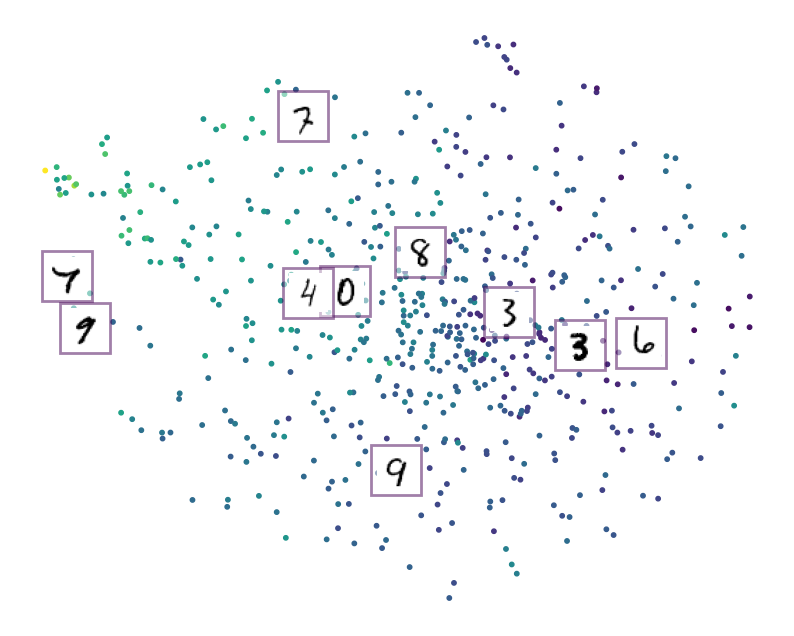

In [ ]:
import numpy as np
import matplotlib.patches as patches

# Set the maximum number of annotations
max_annotations = 10

# Randomly select `max_annotations` indices with their corresponding energies
random_indices = np.random.choice(len(embedding), size=max_annotations, replace=False)
random_energies = energies_np[random_indices]

plt.figure(figsize=(10, 8))
cmap = plt.cm.viridis  # Use the "viridis" colormap
plt.scatter(embedding[:, 0], embedding[:, 1], c=energies_np, s=10, cmap=cmap)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(embedding):
    # Check if the current index and energy are in the randomly selected indices and energies
    if (index in random_indices) and (energies_np[index] in random_energies):
        dist = np.sum((position - image_positions) ** 2, axis=1)
        if np.min(dist) > 0.02:  # if far enough from other images
            image_positions = np.r_[image_positions, [position]]
            imagebox = mpl.offsetbox.AnnotationBbox(
                mpl.offsetbox.OffsetImage(X_test[index], cmap="binary"),
                position, bboxprops={"edgecolor": cmap(energies_np[index]), "lw": 2, "alpha": 0.5})  # Adjust alpha value here
            plt.gca().add_artist(imagebox)

            # Add arrow from imagebox to point
            arrow = patches.FancyArrowPatch(
                position, position,  # start and end point of the arrow (same point for now)
                arrowstyle='->',  # arrow style
                mutation_scale=10,  # scale of the arrowhead
                connectionstyle='arc3,rad=0.5',  # curvature of the arrow
                edgecolor=cmap(energies_np[index]),  # color based on energy
                lw=1.5  # line width
            )
            plt.gca().add_patch(arrow)

plt.axis("off")
plt.show()


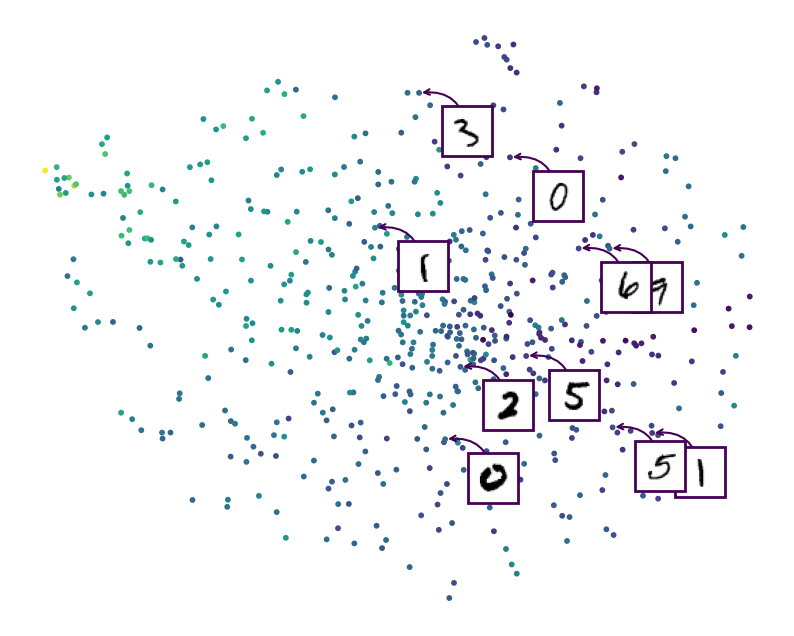

In [ ]:
import numpy as np
import matplotlib.patches as patches

# Set the maximum number of annotations
max_annotations = 10

# Randomly select `max_annotations` indices with their corresponding energies
random_indices = np.random.choice(len(embedding), size=max_annotations, replace=False)
random_energies = energies_np[random_indices]

plt.figure(figsize=(10, 8))
cmap = plt.cm.viridis  # Use the "viridis" colormap
plt.scatter(embedding[:, 0], embedding[:, 1], c=energies_np, s=10, cmap=cmap)

image_positions = np.array([[1., 1.]])
offset = np.array([0.5, -0.5])  # Offset values for x and y directions

for index, position in enumerate(embedding):
    # Check if the current index and energy are in the randomly selected indices and energies
    if (index in random_indices) and (energies_np[index] in random_energies):
        dist = np.sum((position - image_positions) ** 2, axis=1)
        if np.min(dist) > 0.02:  # if far enough from other images
            image_positions = np.r_[image_positions, [position]]
            offset_position = position + offset  # Apply offset to the position

            imagebox = mpl.offsetbox.AnnotationBbox(
                mpl.offsetbox.OffsetImage(X_test[index], cmap="binary"),
                offset_position, bboxprops={"edgecolor": cmap(energies_np[index]), "lw": 2, "alpha": 1})  # Adjust alpha value here
            plt.gca().add_artist(imagebox)

            # Add arrow from imagebox to point
            arrow = patches.FancyArrowPatch(
                offset_position, position,  # start and end point of the arrow
                arrowstyle='->',  # arrow style
                mutation_scale=10,  # scale of the arrowhead
                connectionstyle='arc3,rad=0.5',  # curvature of the arrow
                edgecolor=cmap(energies_np[index]),  # color based on energy
                lw=1.5  # line width
            )
            plt.gca().add_patch(arrow)

plt.axis("off")
plt.show()


IndexError: ignored

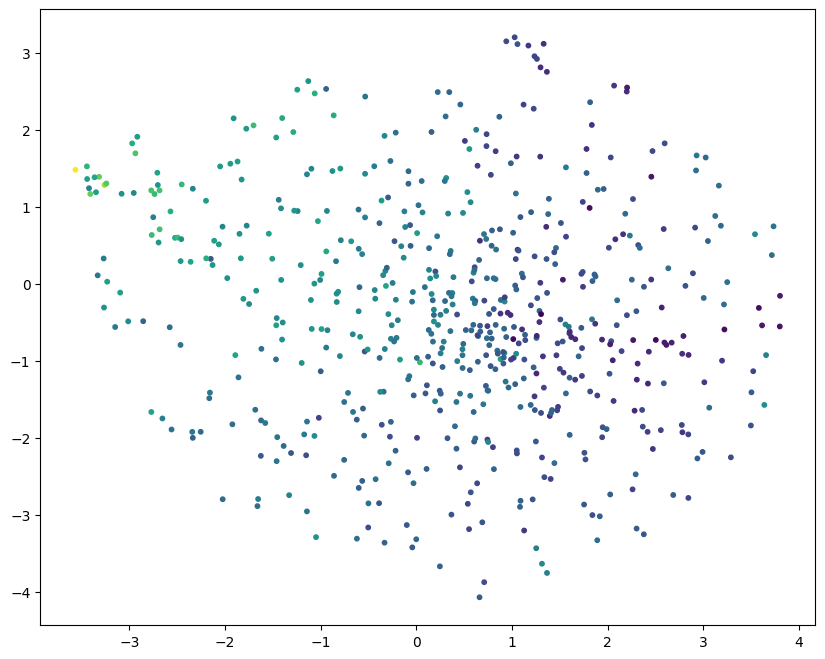

In [ ]:
import numpy as np
import matplotlib.patches as patches

# Set the maximum number of annotations
max_annotations = 10

# Randomly select `max_annotations` indices with their corresponding energies
random_indices = np.random.choice(len(embedding), size=max_annotations, replace=False)
random_energies = energies_np[random_indices]
nD_values_selected = nD_values_np[random_indices]

plt.figure(figsize=(10, 8))
cmap = plt.cm.viridis  # Use the "viridis" colormap
plt.scatter(embedding[:, 0], embedding[:, 1], c=energies_np, s=10, cmap=cmap)

image_positions = np.array([[1., 1.]])
offset = np.array([0.1, -0.1])  # Offset values for x and y directions

for index, position in enumerate(embedding):
    # Check if the current index and energy are in the randomly selected indices and energies
    if (index in random_indices) and (energies_np[index] in random_energies):
        dist = np.sum((position - image_positions) ** 2, axis=1)
        if np.min(dist) > 0.02:  # if far enough from other images
            image_positions = np.r_[image_positions, [position]]
            offset_position = position + offset  # Apply offset to the position

            value_text = str(nD_values_selected[index])  # Convert value to string

            imagebox = mpl.offsetbox.AnnotationBbox(
                mpl.offsetbox.TextArea(value_text, textprops={"color": "black", "fontsize": 10}),
                offset_position, bboxprops={"edgecolor": cmap(energies_np[index]), "lw": 2, "alpha": 0.5})  # Adjust alpha value here
            plt.gca().add_artist(imagebox)

            # Add arrow from imagebox to point
            arrow = patches.FancyArrowPatch(
                offset_position, position,  # start and end point of the arrow
                arrowstyle='->',  # arrow style
                mutation_scale=10,  # scale of the arrowhead
                connectionstyle='arc3,rad=0.5',  # curvature of the arrow
                edgecolor=cmap(energies_np[index]),  # color based on energy
                lw=1.5  # line width
            )
            plt.gca().add_patch(arrow)

plt.axis("off")
plt.show()


IndexError: ignored

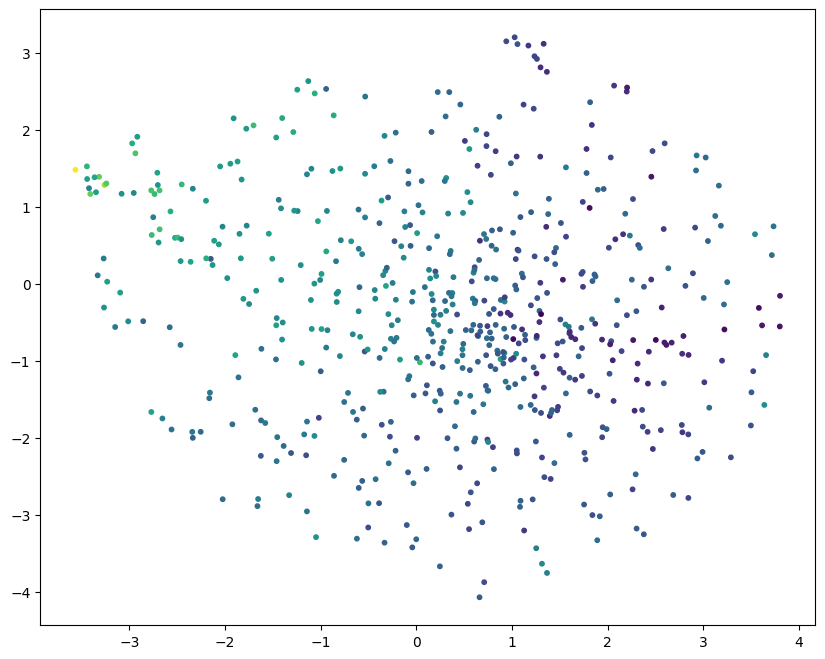

In [ ]:
import numpy as np
import matplotlib.patches as patches

# Set the maximum number of annotations
max_annotations = 10

# Check if the length of nD_values_np is sufficient
if len(nD_values_np) < max_annotations:
    print("Error: Insufficient number of values in nD_values_np.")
    exit()

# Randomly select `max_annotations` indices with their corresponding energies
random_indices = np.random.choice(len(embedding), size=max_annotations, replace=False)
random_energies = energies_np[random_indices]
nD_values_selected = nD_values_np[random_indices]

plt.figure(figsize=(10, 8))
cmap = plt.cm.viridis  # Use the "viridis" colormap
plt.scatter(embedding[:, 0], embedding[:, 1], c=energies_np, s=10, cmap=cmap)

image_positions = np.array([[1., 1.]])
offset = np.array([0.1, -0.1])  # Offset values for x and y directions

for index, position in enumerate(embedding):
    # Check if the current index and energy are in the randomly selected indices and energies
    if (index in random_indices) and (energies_np[index] in random_energies):
        dist = np.sum((position - image_positions) ** 2, axis=1)
        if np.min(dist) > 0.02:  # if far enough from other images
            image_positions = np.r_[image_positions, [position]]
            offset_position = position + offset  # Apply offset to the position

            value_text = str(nD_values_selected[index])  # Convert value to string

            imagebox = mpl.offsetbox.AnnotationBbox(
                mpl.offsetbox.TextArea(value_text, textprops={"color": "black", "fontsize": 10}),
                offset_position, bboxprops={"edgecolor": cmap(energies_np[index]), "lw": 2, "alpha": 0.5})  # Adjust alpha value here
            plt.gca().add_artist(imagebox)

            # Add arrow from imagebox to point
            arrow = patches.FancyArrowPatch(
                offset_position, position,  # start and end point of the arrow
                arrowstyle='->',  # arrow style
                mutation_scale=10,  # scale of the arrowhead
                connectionstyle='arc3,rad=0.5',  # curvature of the arrow
                edgecolor=cmap(energies_np[index]),  # color based on energy
                lw=1.5  # line width
            )
            plt.gca().add_patch(arrow)

plt.axis("off")
plt.show()


In [ ]:
nD_values_selected

array([6., 2., 2., 2., 6., 6., 4., 5., 0., 8.])

In [ ]:
# 1
import os
import numpy as np
import plotly.express as px
from sklearn.manifold import TSNE
import pandas as pd

xyz_dir = 'hojas-1-60000/'

coords_all = []
energies = []
nD_values = []
nuclear_to_atom_type_map = {6: 0, 7: 1, 5: -1}
element_to_nuclear_charge_map = {"C": 6, "N": 7, "B": 5}
file_count = 0
for file_name in [f for f in os.listdir(xyz_dir) if f.endswith('.xyz')]:
    file_count += 1
    #if file_count >= 60000:
    #    break
    file = os.path.join(xyz_dir, file_name)

    with open(file) as f:
        n_atoms = int(f.readline().strip())
        energy, nD, nC, nB, nN = map(float, f.readline().split()[:5])
        energies.append(energy)
        nD_values.append(nD)

        lines = [line.strip().split() for line in f]
        nuclear = np.array([element_to_nuclear_charge_map[line[0]] for line in lines])
        atom_type_values = np.vectorize(nuclear_to_atom_type_map.get)(nuclear)
        coords = np.array([list(map(float, line[1:])) for line in lines])
        x_coords = coords[:, 0]  # Extract the x-coordinates from the first column
        y_coords = coords[:, 1]  # Extract the y-coordinates from the second column
        coord_vec = np.concatenate((x_coords, y_coords), axis=0)
        coords_all.append(coord_vec)

# Convert the coords_all, energies, and nD_values lists to NumPy arrays
coords_all_np = np.array(coords_all)
energies_np = np.array(energies)
nD_values_np = np.array(nD_values)

# Perform t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42,perplexity=30)
embedding = tsne.fit_transform(coords_all_np)

# Create a dataframe with coordinates, energies, and nD values
data = {
    'X': embedding[:, 0],
    'Y': embedding[:, 1],
    'Energy': energies_np,
    'nD': nD_values_np
}
df = pd.DataFrame(data)

# Plot the t-SNE embedding with colored dots and labeled points using Plotly Express
fig = px.scatter(df, x='X', y='Y', color='Energy', hover_data=['Energy', 'nD'],
                 color_continuous_scale='jet'
                 )
fig.update_traces(textposition='top center')
fig.update_layout(
    title='t-SNE Embedding',
    xaxis_title='t-SNE Dimension 1',
    yaxis_title='t-SNE Dimension 2'
)
fig.show()

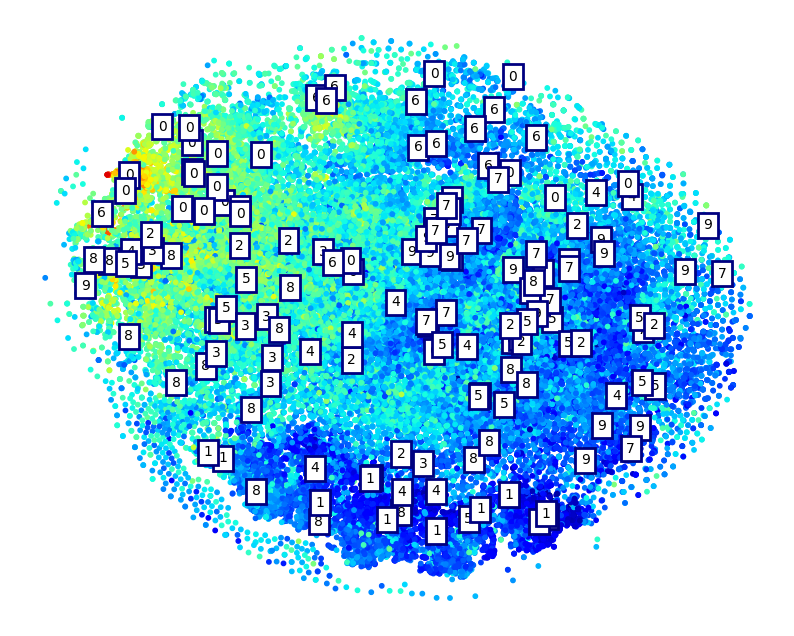

In [ ]:
import numpy as np
import matplotlib.patches as patches

# Set the maximum number of annotations
max_annotations = 150

# Check if the length of nD_values_np is sufficient
if len(nD_values_np) < max_annotations:
    print("Error: Insufficient number of values in nD_values_np.")
    exit()

# Randomly select `max_annotations` indices with their corresponding energies
random_indices = np.random.choice(len(embedding), size=max_annotations, replace=False)
random_energies = energies_np[random_indices]
nD_values_selected = nD_values_np[random_indices]

plt.figure(figsize=(10, 8))
cmap = plt.cm.jet  # Use the "viridis" colormap
plt.scatter(embedding[:, 0], embedding[:, 1], c=energies_np, s=10, cmap=cmap)

image_positions = np.array([[1., 1.]])
offset = np.array([0.0, 0.0])  # Offset values for x and y directions

for index, position in enumerate(embedding):
    # Check if the current index and energy are in the randomly selected indices and energies
    if (index in random_indices) and (energies_np[index] in random_energies):
        dist = np.sum((position - image_positions) ** 2, axis=1)
        if np.min(dist) > 0.02:  # if far enough from other images
            image_positions = np.r_[image_positions, [position]]
            offset_position = position + offset  # Apply offset to the position

            value_text = str( int(nD_values_selected[random_indices.tolist().index(index)]) )  # Convert value to string

            imagebox = mpl.offsetbox.AnnotationBbox(
                mpl.offsetbox.TextArea(value_text, textprops={"color": "black", "fontsize": 10}),
                offset_position, bboxprops={"edgecolor": cmap(energies_np[index]), "lw": 2, "alpha": 1}
                )  # Adjust alpha value here
            plt.gca().add_artist(imagebox)

            # Add arrow from imagebox to point
            arrow = patches.FancyArrowPatch(
                offset_position, position,  # start and end point of the arrow
                arrowstyle='->',  # arrow style
                mutation_scale=10,  # scale of the arrowhead
                connectionstyle='arc3,rad=0.5',  # curvature of the arrow
                edgecolor=cmap(energies_np[index]),  # color based on energy
                lw=1.5  # line width
            )
            plt.gca().add_patch(arrow)

plt.axis("off")
plt.show()


In [ ]:
import os
import numpy as np
import plotly.express as px
import pandas as pd

xyz_dir = 'hojas-1-60000/'

energies = []
nD_values = []

for file_name in [f for f in os.listdir(xyz_dir) if f.endswith('.xyz')]:
    file = os.path.join(xyz_dir, file_name)

    with open(file) as f:
        n_atoms = int(f.readline().strip())
        energy, nD, nC, nB, nN = map(float, f.readline().split()[:5])
        energies.append(energy)
        nD_values.append(nD)

# Convert the energies and nD_values lists to NumPy arrays
energies_np = np.array(energies)
nD_values_np = np.array(nD_values)

# Create a dataframe with energies and nD values
data = {
    'Energy': energies_np,
    'nD': nD_values_np
}
df = pd.DataFrame(data)

# Plot the energies vs digit labels using Plotly Express
fig = px.scatter(df, x='nD', y='Energy', color='nD', hover_data=['nD', 'Energy'],
                 color_continuous_scale='jet')
fig.update_traces(textposition='top center')
fig.update_layout(
    title='Energy vs Digit Label',
    xaxis_title='Digit Label (nD)',
    yaxis_title='Energy'
)
fig.show()


In [ ]:
import os
import numpy as np
import plotly.express as px
import pandas as pd

xyz_dir = 'hojas-1-60000/'

energies = []
nD_values = []
total_impurities = []

for file_name in [f for f in os.listdir(xyz_dir) if f.endswith('.xyz')]:
    file = os.path.join(xyz_dir, file_name)

    with open(file) as f:
        n_atoms = int(f.readline().strip())
        energy, nD, nC, nB, nN = map(float, f.readline().split()[:5])
        energies.append(energy)
        nD_values.append(nD)
        total_impurities.append(nB + nN)

# Convert the energies, nD_values, and total_impurities lists to NumPy arrays
energies_np = np.array(energies)
nD_values_np = np.array(nD_values)
total_impurities_np = np.array(total_impurities)

# Create a dataframe with energies, nD values, and total impurities
data = {
    'Energy': energies_np,
    'nD': nD_values_np,
    'Total Impurities': total_impurities_np
}
df = pd.DataFrame(data)

# Plot the energies, nD values, and total impurities using Plotly Express
fig = px.scatter_3d(df, x='Energy', y='nD', z='Total Impurities', color='Total Impurities',
                    hover_data=['Energy', 'nD', 'Total Impurities'],
                    color_continuous_scale='jet')
fig.update_traces(textposition='top center')
fig.update_layout(
    title='Energy, nD, and Total Impurities',
    scene=dict(
        xaxis_title='Energy',
        yaxis_title='nD',
        zaxis_title='Total Impurities'
    )
)
fig.show()


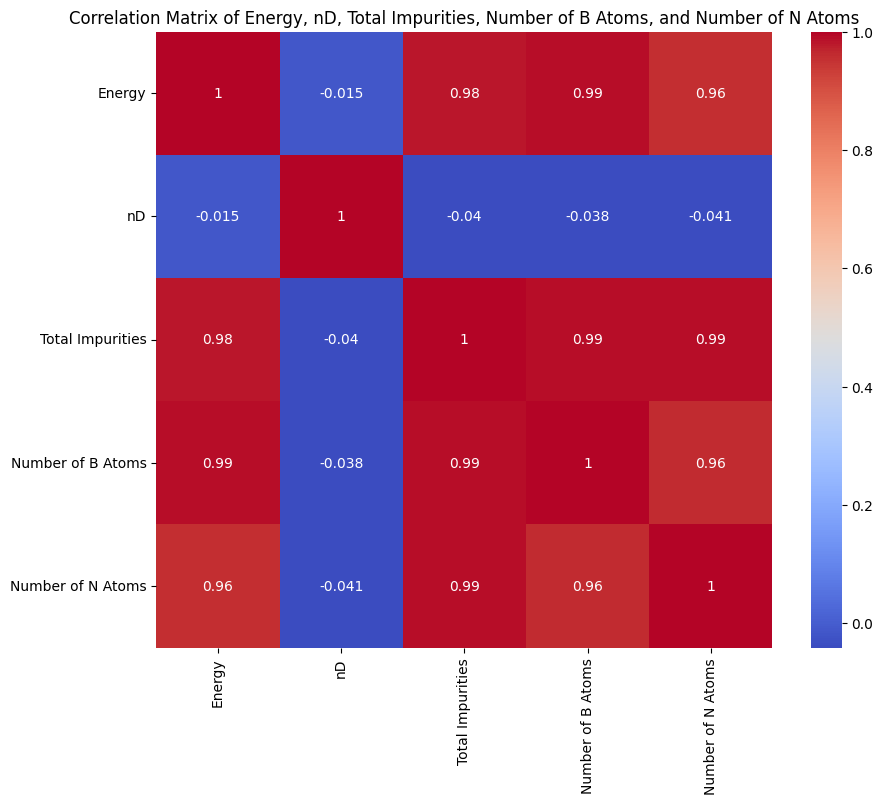

In [ ]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

xyz_dir = 'hojas-1-60000/'

energies = []
nD_values = []
total_impurities = []
nB_atoms = []
nN_atoms = []

for file_name in [f for f in os.listdir(xyz_dir) if f.endswith('.xyz')]:
    file = os.path.join(xyz_dir, file_name)

    with open(file) as f:
        n_atoms = int(f.readline().strip())
        energy, nD, nC, nB, nN = map(float, f.readline().split()[:5])
        energies.append(energy)
        nD_values.append(nD)
        total_impurities.append(nB + nN)
        nB_atoms.append(nB)
        nN_atoms.append(nN)

# Create a dataframe with energies, nD values, total impurities, nB atoms, and nN atoms
data = {
    'Energy': energies,
    'nD': nD_values,
    'Total Impurities': total_impurities,
    'Number of B Atoms': nB_atoms,
    'Number of N Atoms': nN_atoms
}
df = pd.DataFrame(data)

# Compute the correlation matrix
corr_matrix = df.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)

plt.title('Correlation Matrix of Energy, nD, Total Impurities, Number of B Atoms, and Number of N Atoms')
plt.show()



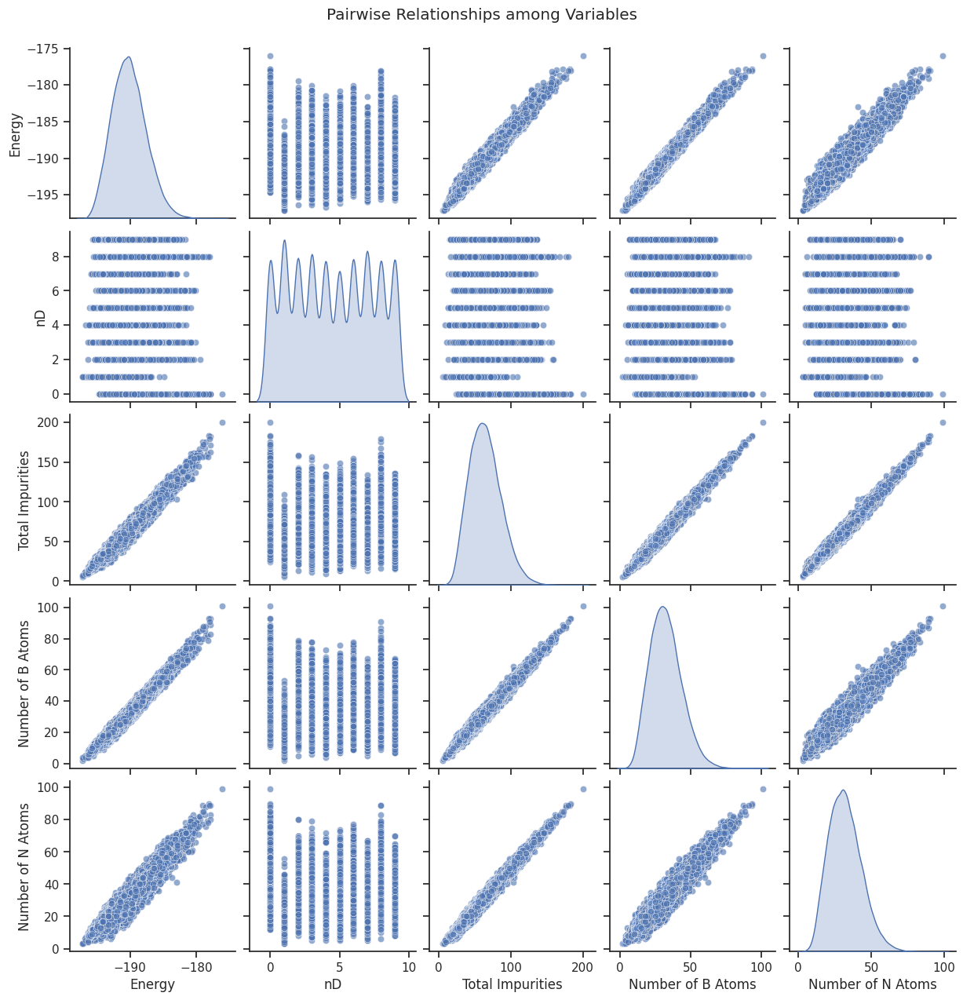

In [ ]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

xyz_dir = 'hojas-1-60000/'

energies = []
nD_values = []
total_impurities = []
nB_atoms = []
nN_atoms = []

for file_name in [f for f in os.listdir(xyz_dir) if f.endswith('.xyz')]:
    file = os.path.join(xyz_dir, file_name)

    with open(file) as f:
        n_atoms = int(f.readline().strip())
        energy, nD, nC, nB, nN = map(float, f.readline().split()[:5])
        energies.append(energy)
        nD_values.append(nD)
        total_impurities.append(nB + nN)
        nB_atoms.append(nB)
        nN_atoms.append(nN)

# Create a dataframe with energies, nD values, total impurities, nB atoms, and nN atoms
data = {
    'Energy': energies,
    'nD': nD_values,
    'Total Impurities': total_impurities,
    'Number of B Atoms': nB_atoms,
    'Number of N Atoms': nN_atoms
}
df = pd.DataFrame(data)

# Create a pairplot of the variables
sns.set(style="ticks")
sns.pairplot(df, diag_kind='kde', plot_kws={'alpha': 0.6})

plt.suptitle('Pairwise Relationships among Variables', y=1.02)
plt.show()


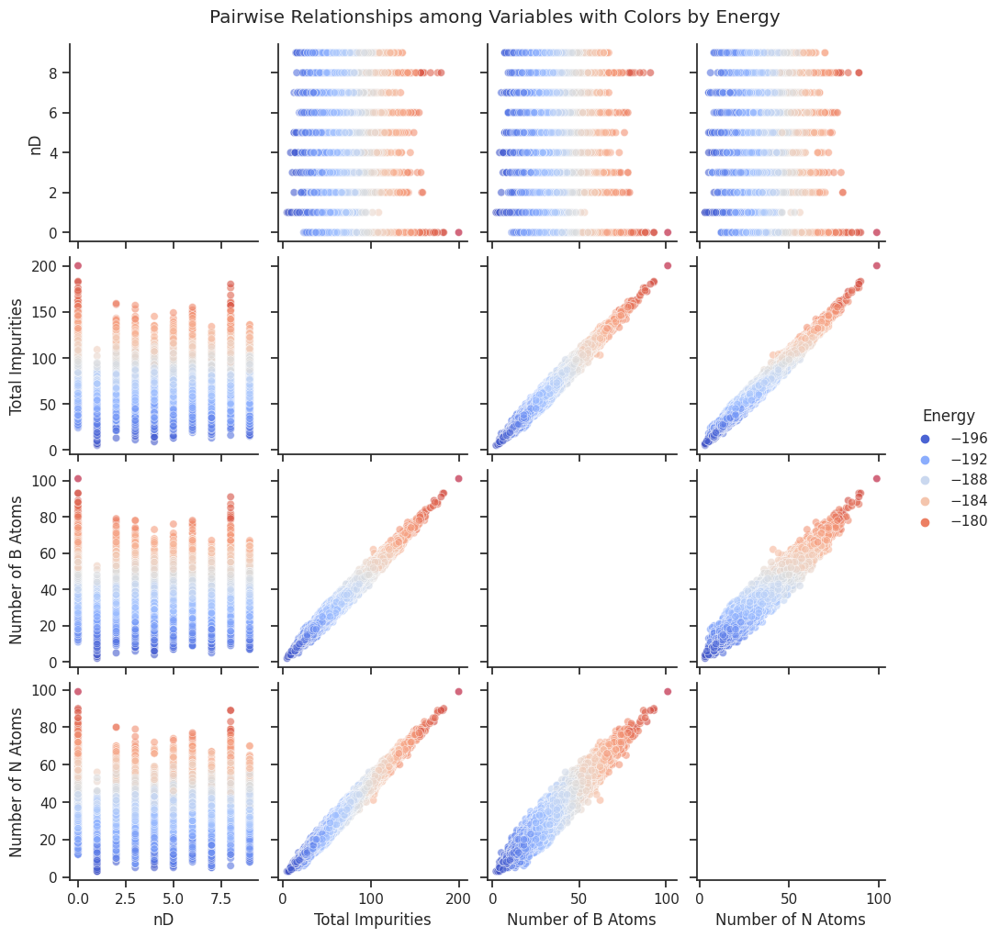

In [ ]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

xyz_dir = 'hojas-1-60000/'

energies = []
nD_values = []
total_impurities = []
nB_atoms = []
nN_atoms = []

for file_name in [f for f in os.listdir(xyz_dir) if f.endswith('.xyz')]:
    file = os.path.join(xyz_dir, file_name)

    with open(file) as f:
        n_atoms = int(f.readline().strip())
        energy, nD, nC, nB, nN = map(float, f.readline().split()[:5])
        energies.append(energy)
        nD_values.append(nD)
        total_impurities.append(nB + nN)
        nB_atoms.append(nB)
        nN_atoms.append(nN)

# Create a dataframe with energies, nD values, total impurities, nB atoms, and nN atoms
data = {
    'Energy': energies,
    'nD': nD_values,
    'Total Impurities': total_impurities,
    'Number of B Atoms': nB_atoms,
    'Number of N Atoms': nN_atoms
}
df = pd.DataFrame(data)

# Create a pairplot of the variables with colors by energy
sns.set(style="ticks")
sns.pairplot(df, diag_kind='kde', plot_kws={'alpha': 0.6}, hue='Energy', palette='coolwarm')

plt.suptitle('Pairwise Relationships among Variables with Colors by Energy', y=1.02)
plt.show()
